### 大气透射模型
首先，在计算机图形学和计算机视觉中，存在一个很重要的模型，这种模型被广泛的应用于雾图中

$$\mathbf{I(x)} = \mathbf{J(x)}t(\mathbf{x}) + \mathbf{A}(1 − t(\mathbf{x})) \tag{1}$$


* $\mathbf{I}$ 观测到的强度，也就是实际成像灰度值
* $\mathbf{J}$ 表示实际环境物体光
* $\mathbf{A}$ 表示环境大气投射光
* t 表示环境光线透射率，表达率的是实际环境物体散射的光芒会在空气中衰减

**去雾的目的就是计算出来投射模型中的值，还原实际环境物体光芒 A**

---


#### 1. 透射衰减 -> 环境光线透射率t
假定大气中对环境光散射造成的光线衰减是恒定的，则从距离越远衰减越大，透射率与距离成指数关系：
$$t(\mathbf{x}) = e^{-βd(\mathbf{x})}\tag{*}$$
* 式中 d 表示距离
  
---

#### 2. 暗通道先验
**暗通道先验**的提出是基于以下观测事实：统计发现，对于环境成像图，在没有雾天的情况下，非天空区域在局部会存在一个暗通道，这个暗通道的光强度非常之低。换言之，在一个局部区域内的光强度最小值接近于0
**定义**：
$$J^{dark}(\mathbf{x}) = \min_{c\in\{r,g,b\}}
(\min_{y\in{\Omega}(x)}J^c(\mathbf{y}))
\tag{2}$$

则$J^{dark}$表示暗通道结果

证据：  

![暗通道示例](doc_images/2022-09-01_15-01.png)
![统计结果](doc_images/2022-09-01_15-02.png)

---

#### 2.1 求取投射率
假设：我们已知环境光线 $\mathbf A$
对公式（2）的两边对邻域去最小值操作，得
$$\min_{\mathbf y\in{\Omega(x)}} I^c(\mathbf y) = \widetilde{\mathbf t}(x) \min_{\mathbf y\in{\Omega(x)}} (J^c(\mathbf y) + (1-\widetilde{\mathbf t}(x)))A^c \tag{3}$$
Ac 大气光是个常量，两边同除以Ac
$$\min_{\mathbf y\in{\Omega(x)}} (\frac {I^c(\mathbf y)}{A^c}) = \widetilde{\mathbf t}(x) \min_{\mathbf y\in{\Omega(x)}} (\frac{J^c(\mathbf y)}{A^c}) + (1-\widetilde{\mathbf t}(x))) \tag{4}$$

上式为单个通道等式，对其三(N)个通道进行取最小：
$$\min_{c}(\min_{\mathbf y\in{\Omega(x)}} (\frac {I^c(\mathbf y)}{A^c})) = \widetilde{\mathbf t}(x) \min_c(\min_{\mathbf y\in{\Omega(x)}} (\frac{J^c(\mathbf y)}{A^c})) + (1-\widetilde{\mathbf t}(x))) \tag{5}$$

**根据暗通道先验**式（2）
$$J^{dark}(\mathbf{x}) = \min_{c\in\{r,g,b\}}
(\min_{y\in{\Omega}(x)}J^c(\mathbf{y}))
=0\tag{6}$$
由于Ac一般都为正值， 所以
$$\min_c(\min_{\mathbf y\in{\Omega(x)}} (\frac{J^c(\mathbf y)}{A^c}))=0 \tag{7}$$

代入（5）式，即可求解透射率/穿透率 
$$\widetilde{\mathbf t}(x))= 1-\min_{c}(\min_{\mathbf y\in{\Omega(x)}} (\frac {I^c(\mathbf y)}{A^c}))  \tag{8}$$

---

**补充说明**
之前的暗通道先验的条件是在非天空区域，所以上式(8)只适用于无天空图像。
**但是**，大部分情况下，天空区域的亮度值通常于大气光非常接近，所以有，在天空区域
$$\min_{c}(\min_{\mathbf y\in{\Omega(x)}} (\frac {I^c(\mathbf y)}{A^c})) \to 1, \Rightarrow \widetilde{\mathbf t}(x)) \to 0$$

同时，由于天空区域一般距离为无穷远，根据透射衰减公式(*)，透射率趋近于0，所以**式(8)在天空区域也成立**

**补充说明2**
由于人眼观测物体时的透视深度现象，及远距离物体自然光线会弱一些，而使用上述方法直接去雾的话，会造成图像不真实，缺乏透视深度特性，所以我们会对加一个透视衰减补偿
$$\widetilde{\mathbf t}(x))= 1-\omega \min_{c}(\min_{\mathbf y\in{\Omega(x)}} (\frac {I^c(\mathbf y)}{A^c}))  \tag{9}$$
其中$\omega$取一个小于1的定值常数，文中取0.95

---
---

In [1]:
# 导入基础包
import cv2
import sys, os
import numpy as np
from tqdm import tqdm

In [2]:
imgae_root = '/home/andy/00_workspace/JupyterCode/yh_cv/data/'

# img_path = '/home/andy/00_workspace/JupyterCode/yh_cv/data/R-C.jpeg'
# img_path = '/home/andy/00_workspace/JupyterCode/yh_cv/data/R-C2.jpeg'
# img_path = '/home/andy/00_workspace/JupyterCode/yh_cv/data/2293.jpg'
# img_path = '/home/andy/00_workspace/JupyterCode/yh_cv/data/0.jpeg'
# img = cv2.imread(img_path)
# img = cv2.resize(img, (600, 600*img.shape[0]//img.shape[1]))
imgs = {}
for fn in os.listdir(imgae_root):
    # if not '003' in fn:
    #     continue
    img = cv2.imread(os.path.join(imgae_root, fn))
    imgs[fn] = cv2.resize(img, (600, 600*img.shape[0]//img.shape[1]))[:,:,[2,1,0]]

# img = img[:,:,[2,1,0]]
print(len(imgs))

6


In [3]:
# display config
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

def auto_show(idx,img, title = None, norm=False):
    plt.subplot(*idx)
    if title is not None:
        plt.title(title)
        
    single_channel = not (len(img.shape) > 2 and img.shape[2]==3)
    norm_colors = norm=None if norm else \
                            matplotlib.colors.Normalize(0, 255, True) if img.dtype == 'uint8' else \
                            matplotlib.colors.Normalize(0.0, 1.0, True)
    plt.imshow(img, cmap='gray' if single_channel else None, 
                    norm=norm_colors)
    plt.axis('off')
    

In [4]:
## 计算暗通道和透射衰减率
# 超参数
PATCH_SIZE = 15
w          = 0.95

PAD        = PATCH_SIZE // 2
#
def get_Jdark_A_t(img):
    t = np.zeros((img.shape[0], img.shape[1]), np.float32)
    Jdark = np.zeros((img.shape[0], img.shape[1]), np.float32)
    # 1. gen dark chanel 
    for i in tqdm(range(PAD+1, img.shape[0]-PAD-1)):
        for j in range(PAD+1, img.shape[1]-PAD-1):
            patch = img[i-PAD:i+PAD+1, j-PAD:j+PAD+1]
            Jdark[i,j] = patch.min()
            # break
        # break
    # 2. gen atmospheric light A
    PIXEL_SIZE = img.shape[0]*img.shape[1]
    k = (int(PIXEL_SIZE * 0.001) // 10) * 10
    # print(k)
    topK_idxs = Jdark.reshape(1,-1).argsort()[0][-k:]
    # print(topK_idxs.shape)
    # topK_idxs0, topK_idxs1 = topK_idxs // img.shape[0], topK_idxs % img.shape[0]
    max_img = img.reshape(-1,3)[topK_idxs]
    # print(max_img.shape)
    # Ac = max_img.max(0)
    Ac = max_img.mean(0)
    print(Ac)
    A = np.expand_dims(Ac, 0).repeat(img.shape[1], axis=0)
    A = np.expand_dims(A, 0).repeat(img.shape[0], axis=0)

    # 3. gen t~
    for i in tqdm(range(PAD+1, img.shape[0]-PAD-1)):
        for j in range(PAD+1, img.shape[1]-PAD-1):
            patch = img[i-PAD:i+PAD+1, j-PAD:j+PAD+1]
            I_Ac = patch / Ac
            # print(I_Ac.shape)
            t[i,j] = 1 - I_Ac.min()*w
    
    return Jdark, A, t

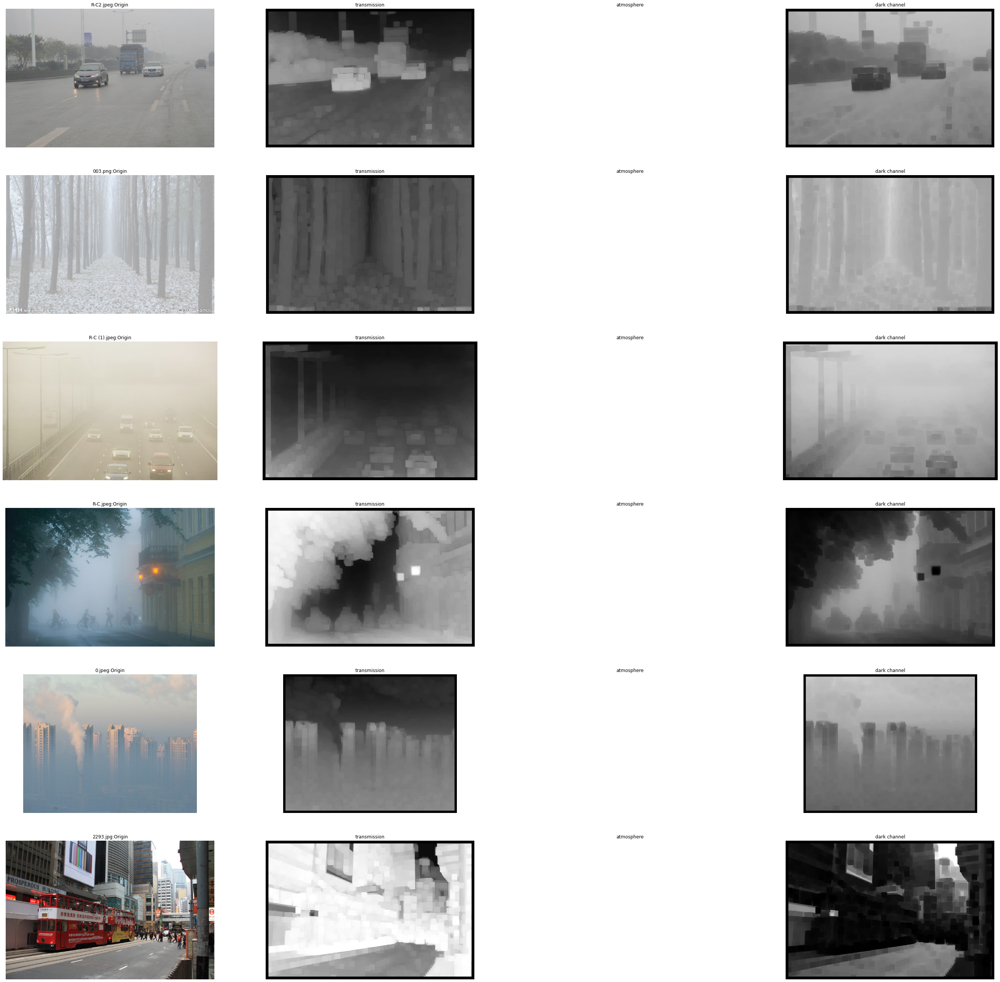

In [6]:
img_cnt = len(imgs)

from IPython.display import clear_output

dpi = plt.rcParams['figure.dpi']
plt.figure(figsize=(img.shape[1]*4//dpi, img.shape[0]*img_cnt//dpi))

Jdarks = {}
As     = {}
ts     = {}

for i, fn in enumerate(imgs):
    Jdarks[fn], As[fn], ts[fn] = get_Jdark_A_t(imgs[fn])
    auto_show((img_cnt, 4, 1+i*4), imgs[fn], fn+':Origin')
    auto_show((img_cnt, 4, 2+i*4), ts[fn], 'transmission')
    auto_show((img_cnt, 4, 3+i*4), As[fn], 'atmosphere')
    auto_show((img_cnt, 4, 4+i*4), Jdarks[fn].astype('uint8'), 'dark channel')

clear_output()
plt.show()

#### 2.2 Soft Matting
上图中明显看到，透射率在求取的时候是在局部邻域内做极值求取的，有明显的边缘马赛克效应，此时为了获得较为平滑接近于实际的投射率，可使用**Soft Matting**

首先抛出计算平滑透射率的惩罚函数：
$$E(\mathbf t) = \mathbf t^T \mathbf L \mathbf t + \lambda (\mathbf t − \widetilde{\mathbf t})^T (\mathbf t − \widetilde{\mathbf t}) \tag{10}$$

* 其中  L 叫做 Matting Laplacian 矩阵，矩阵中第 （i,j）个元素的值为:
  $$\sum_{k|(i,j) \in \omega_k}(\delta_{ij}-\frac{1}{|\omega_k|}(1+(\mathbf I_i - \mu_k)^T (\Sigma_k+\frac{\epsilon}{|\omega_k|}\mathbf U_3)^{-1} (\mathbf I_j - \mu_k) ) ) \tag{11}$$

* 其中
* $\delta_{ij}$为克罗内克函数，即当i==j时值为1，其余为0
对式（10）求解最优值解为：
$$(\mathbf L + \lambda \mathbf{U}) \mathbf t = \lambda \widetilde {\mathbf{t}}$$

本文中 $\lambda$ 的取值为 $10^{-4}$

---

In [385]:
### 4. get soft transmission
'''
# ! 此处方法结果不对
'''
SOFT_KSIZE = 3
SOFT_PAD = SOFT_KSIZE // 2
    
def get_soft_t(img, t):
    w_k = SOFT_KSIZE*SOFT_KSIZE
    eps = 1e-6
    lmd = 1e-4

    tt = np.zeros(t.shape, np.float32)
    # L = np.zeros((w_k,w_k), np.float64)
    L_light = np.zeros(t.shape, np.float64)

    # plt.ion()
    for i in tqdm(range(PAD+1, t.shape[0]-PAD-1)):
        for j in range(PAD+1, t.shape[1]-PAD-1):
            patch = img[i-SOFT_PAD:i+SOFT_PAD+1, j-SOFT_PAD:j+SOFT_PAD+1]
            # print(patch)
            # print(patch.shape)
            patch = patch.reshape((3,-1))
            avg = patch.mean(1)
            var = np.cov(patch)
            var_I = np.linalg.pinv(var+eps/w_k)
            for k in range(w_k):
                for l in range(w_k):
                    vkl =  (1+(patch[:,k]-avg).reshape(-1,3).dot(var_I).dot((patch[:,l]-avg)))
                    # print(vkl)
                    L_light[k+i-SOFT_PAD,l+j-SOFT_PAD] += (1 if(k==l) else 0) - 1.0/w_k * vkl
                    
            # TT = lmd*np.linalg.pinv(L+lmd).dot(t[i-SOFT_PAD:i+SOFT_PAD+1, j-SOFT_PAD:j+SOFT_PAD+1].reshape(-1))
            # print(TT.shape)
            # tt[i,j] = TT[5]
        # break
    # break
    for i in tqdm(range(PAD+1, t.shape[0]-PAD-1)):
        for j in range(PAD+1, t.shape[1]-PAD-1):
            TT = lmd*np.linalg.pinv(L_light[i-4:i+4+1, j-4:j+4+1]+lmd).dot(t[i-SOFT_PAD:i+SOFT_PAD+1, j-SOFT_PAD:j+SOFT_PAD+1].reshape(-1))
            tt[i,j] = TT[5]
    
    return tt

0it [00:00, ?it/s]

(237406, 9, 9)


1it [01:28, 88.65s/it]

(238004, 9, 9)


2it [03:06, 93.80s/it]

(230828, 9, 9)


3it [04:32, 90.62s/it]

(236808, 9, 9)


4it [07:23, 122.05s/it]

(285844, 9, 9)


5it [12:37, 191.26s/it]

(237406, 9, 9)


6it [16:12, 162.04s/it]


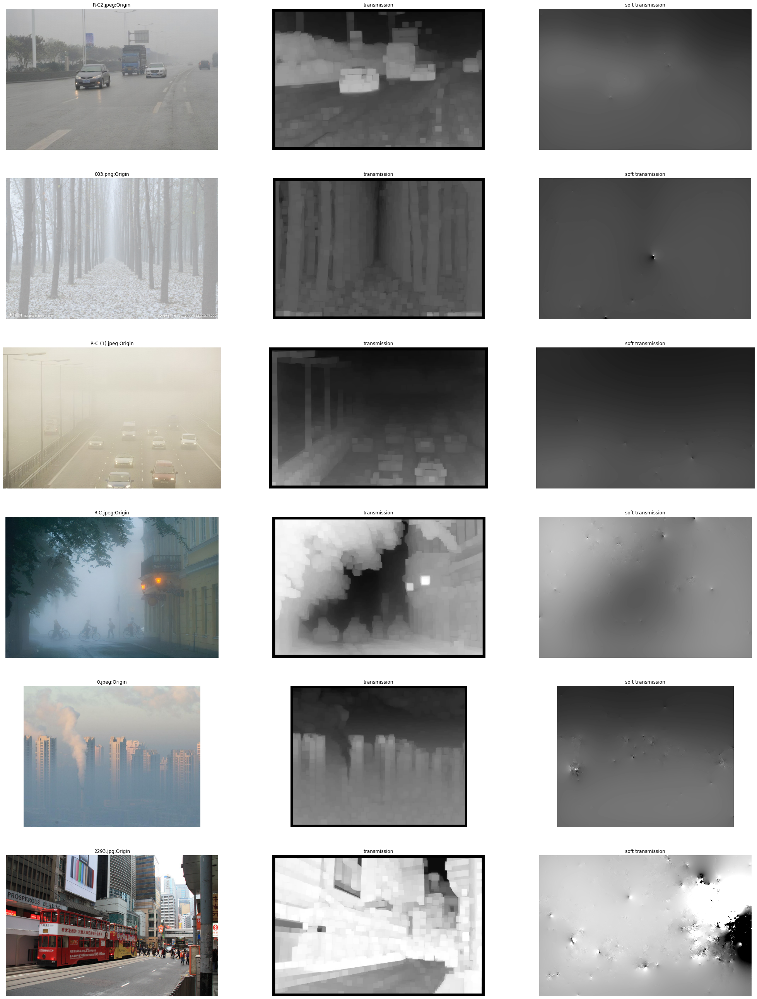

In [44]:
# sys.path.append(os.path.join(os.path.dirname(__file__), '.'))
sys.path.append('/home/andy/00_workspace/JupyterCode/yh_cv')

from lib.closed_form_matting import compute_laplacian
import scipy.sparse
import scipy.sparse.linalg


# LAMBDA = 1e-3
LAMBDA = 1e-3
'''
获得soft matting 闭式解
'''
def closed_soft_t(img, t):
    laplacian = compute_laplacian(img)
    
    # AX=b: A->(L+lambda*U), X=soft_t, b->lambda*t
    confidence = scipy.sparse.diags(LAMBDA*np.ones(laplacian.shape[0]))
    prior = LAMBDA*t.reshape(-1,1)
    soft_t = scipy.sparse.linalg.spsolve(
        laplacian + confidence,
        prior
    )
    return soft_t.reshape(t.shape)

dpi = plt.rcParams['figure.dpi']
plt.figure(figsize=(img.shape[1]*3//dpi, img.shape[0]*img_cnt//dpi))

soft_ts={}
for i, fn in tqdm(enumerate(imgs)):
    # Jdark, A, t[fn] = get_Jdark_A_t(imgs[fn])
    soft_ts[fn] = closed_soft_t(imgs[fn], ts[fn])
    auto_show((img_cnt, 3, 1+i*3), imgs[fn], fn+':Origin')
    auto_show((img_cnt, 3, 2+i*3), ts[fn], 'transmission')
    auto_show((img_cnt, 3, 3+i*3), soft_ts[fn], 'soft transmission')
    
plt.show()

6it [00:00, 55.98it/s]


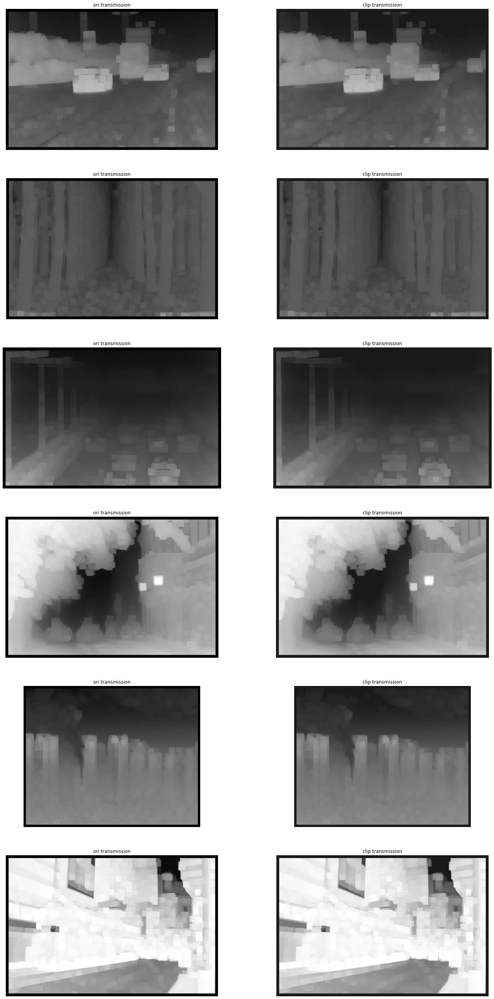

In [7]:
img_cnt = len(imgs)
# 5. get clip t
t0 = 0.1

# USE_SOFT = True
USE_SOFT = False
WIN_COLS = 3 if USE_SOFT else 2

dpi = plt.rcParams['figure.dpi']
plt.figure(figsize=(img.shape[1]*WIN_COLS//dpi, img.shape[0]*img_cnt//dpi))

clip_soft_ts = {}
for i, fn in tqdm(enumerate(imgs)):
    if USE_SOFT:
        clip_soft_ts[fn] = np.clip(soft_ts[fn], 0.1, 1.0)
        auto_show((img_cnt,WIN_COLS,2+i*WIN_COLS), soft_ts[fn], 'soft transmission')
    else:
        clip_soft_ts[fn] = np.clip(ts[fn], 0.1, 1.0)
    auto_show((img_cnt,WIN_COLS,1+i*WIN_COLS), ts[fn], 'ori transmission')
    auto_show((img_cnt,WIN_COLS,WIN_COLS+i*WIN_COLS), clip_soft_ts[fn], 'clip transmission')
plt.show()

6it [00:00, 28.69it/s]

329.70987
-945.01733
527.73755
-988.5625
462.0
-1399.8087
477.5
-1632.5
641.91437
-898.08563
255.0
-2295.0


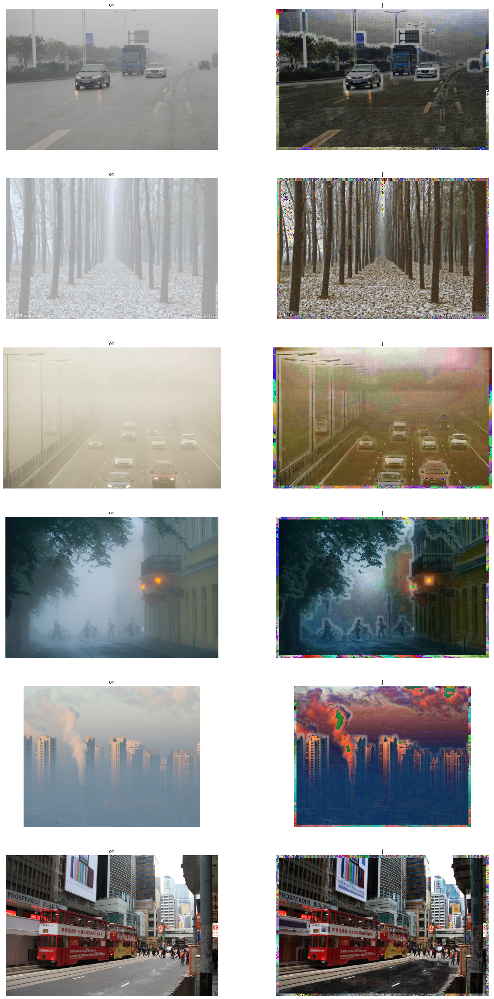

In [8]:
## show result

dpi = plt.rcParams['figure.dpi']
plt.figure(figsize=(img.shape[1]*2//dpi, img.shape[0]*img_cnt//dpi))

for i, fn in tqdm(enumerate(imgs)):
    J = imgs[fn].copy()
    t_clip_map = np.expand_dims(clip_soft_ts[fn], 2).repeat(3, axis=2)
    # J = ((imgs[fn].astype('int32')-As[fn].astype('int32')).astype('int32')/t_clip_map + As[fn].astype('float32'))
    J = ((imgs[fn].astype('float32')-As[fn].astype('float32'))/t_clip_map + As[fn].astype('float32'))

    print(J.max())
    print(J.min())
    auto_show((img_cnt,2,1+i*2),imgs[fn], 'ori')
    auto_show((img_cnt,2,2+i*2),J.astype('uint8'), 'J')

plt.show()

(399, 600, 3)
(399, 600)
winI.shape[bx9x3] =  (233442, 49, 3)
winT.shape[bx9x1] =  (233442, 49, 1)
win_mu.shape[bx1x3] =  (233442, 1, 3)
win_tu.shape[bx1x1] =  (233442, 1, 1)
inv.shape[bx3x3] =  (233442, 3, 3)
win_sum.shape[bx3x1] (233442, 1, 3)
win_m_t.shape (233442, 1, 3)
ak.shape[bx3x1] =  (233442, 3, 1)
bk.shape[bx1x1] =  (233442, 1, 1)
win_inds.shape= (233442, 49)
aks.shape= (399, 600, 3)
bks.shape= (399, 600)
0.733246686377325
0.0
0.3125368853528704


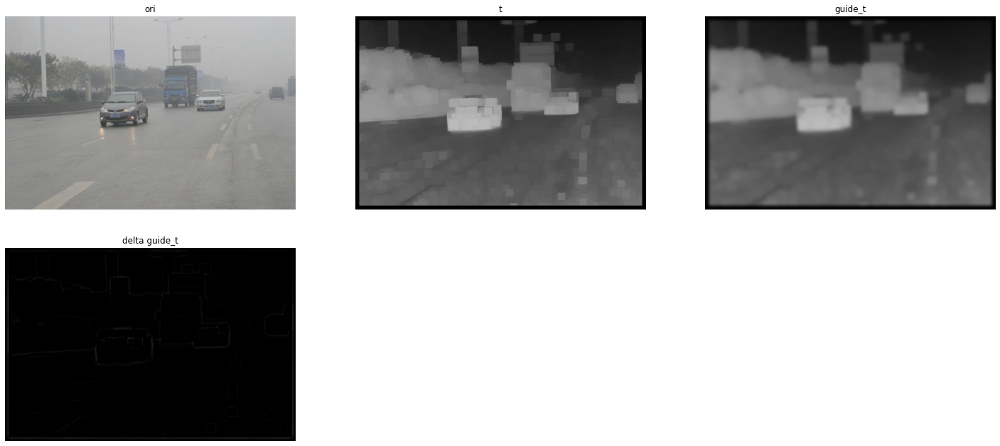

True

In [37]:
import numpy as np
from numpy.lib.stride_tricks import as_strided
import scipy.sparse
import scipy.sparse.linalg


def _rolling_block(A, block=(3, 3)):
    """Applies sliding window to given matrix."""
    shape = (A.shape[0] - block[0] + 1, A.shape[1] - block[1] + 1) + block
    strides = (A.strides[0], A.strides[1]) + A.strides
    return as_strided(A, shape=shape, strides=strides)


#### get guide image filter
def guide_image_filter_transmission(img, trans, eps = 1e-7, win_rad = 1):
    win_size = (win_rad * 2 + 1) ** 2
    h, w, d = img.shape
    # Number of window centre indices in h, w axes
    c_h, c_w = h - 2 * win_rad, w - 2 * win_rad
    win_diam = win_rad * 2 + 1

    indsM = np.arange(h * w).reshape((h, w))
    ravelImg = img.reshape(h * w, d)
    ravelTra = trans.reshape(-1, 1)
    win_inds = _rolling_block(indsM, block=(win_diam, win_diam))

    # win_inds = win_inds.reshape(c_h, c_w, win_size)
    
    win_inds = win_inds.reshape(-1, win_size)
    # image window    
    winI = ravelImg[win_inds].astype(np.float32)
    winT = ravelTra[win_inds].astype(np.float32)
    print('winI.shape[bx9x3] = ', winI.shape)
    print('winT.shape[bx9x1] = ', winT.shape)
    
    win_tu = np.mean(winT, axis=1, keepdims=True)       # p     : bx1x1    
    win_mu = np.mean(winI, axis=1, keepdims=True)       # uk    : bx1x3
    
    win_var = np.einsum('...ji,...jk ->...ik', winI, winI) / win_size - np.einsum('...ji,...jk ->...ik', win_mu, win_mu) # bx3x3

    inv = np.linalg.inv(win_var + eps*np.eye(3))    # b x 3x3

    print('win_mu.shape[bx1x3] = ', win_mu.shape)
    print('win_tu.shape[bx1x1] = ', win_tu.shape)
    print('inv.shape[bx3x3] = ', inv.shape)
    # 
    # ak = (np.einsum('...ij,...ik->...kj', winI, winT)-win_tu*win_mu).swapaxes(1,2)
    win_sum = np.einsum('...ij,...ik->...kj', winI, winT)/win_size
    win_m_t = np.einsum('...ij,...ik->...jk' , win_tu, win_mu)
    print('win_sum.shape[bx3x1]', win_sum.shape)
    print('win_m_t.shape', win_m_t.shape)
    ak = np.einsum('...ij,...kj->...ik', inv, (win_sum- win_m_t) )
    print('ak.shape[bx3x1] = ', ak.shape)
    bk = win_tu - np.einsum('...ij,...ki', ak, win_mu)
    print('bk.shape[bx1x1] = ', bk.shape)
    
    ak_map = np.zeros((h*w, 3, 1), dtype=np.float64)
    bk_map = np.zeros((h*w, 1, 1), dtype=np.float64)
    
    print('win_inds.shape=',win_inds.shape)
    for i, win_ind in enumerate(win_inds):
        ak_map[win_ind] += ak[i]
        bk_map[win_ind] += bk[i]
    
    ak_map /= win_size
    bk_map /= win_size
    
    aks = ak_map.reshape(*trans.shape, 3)
    bks = bk_map.reshape(*trans.shape)
    
    print('aks.shape=', aks.shape)
    print('bks.shape=', bks.shape)
    
    # filterd_trans = np.einsum('...ij,...ki->...kj', ak, winI) + bk
    # print('filterd_trans.shape = ',filterd_trans.shape)
    
    # ret_trans = t.copy().reshape(-1,1)
    ret_trans = np.zeros(trans.shape, dtype=np.float32)
    ret_trans = np.einsum('ijk,ijk->ij', img, aks) + bks
    # pad_size = (w*h-filterd_trans.shape[0]) // 2
    # print('pad_size = ', pad_size)
    # ret_trans[pad_size:-pad_size,0] = filterd_trans[:,5,0]
    # print('ret_trans.shape = ',ret_trans.shape)
    # X = np.einsum('...ij,...jk->...ik', winI - win_mu, inv)
    # vals = np.eye(win_size) - (1.0/win_size)*(1 + np.einsum('...ij,...kj->...ik', X, winI - win_mu))
    # print(vals.shape)
    # nz_indsCol = np.tile(win_inds, win_size).ravel()
    # nz_indsRow = np.repeat(win_inds, win_size).ravel()
    # nz_indsVal = vals.ravel()
    # L = scipy.sparse.coo_matrix((nz_indsVal, (nz_indsRow, nz_indsCol)), shape=(h*w, h*w))
    return ret_trans

img_id = 'R-C2.jpeg'
img = imgs[img_id]
t = ts[img_id]
print(img.shape)
print(t.shape)
guide_t = guide_image_filter_transmission(img, t, eps=255*255, win_rad=3)


'''
Draw
'''

dpi = plt.rcParams['figure.dpi']
plt.figure(figsize=(img.shape[1]*3//dpi, img.shape[0]*2//dpi))

print(guide_t.max())
print(guide_t.min())
print(guide_t.mean())

auto_show((2,3,1),img, 'ori')
auto_show((2,3,2),t, 't')
auto_show((2,3,3),guide_t.reshape(t.shape), 'guide_t')
auto_show((2,3,4),guide_t-t, 'delta guide_t', norm=False)

plt.show()

# cv2.imwrite('trans.png', t*255)


In [38]:

def guidedFilter(p, i, r, e):
    # 1
    mean_I = cv2.boxFilter(i, cv2.CV_64F, (r, r))
    mean_p = cv2.boxFilter(p, cv2.CV_64F, (r, r))
    corr_I = cv2.boxFilter(i * i, cv2.CV_64F, (r, r))
    corr_Ip = cv2.boxFilter(i * p, cv2.CV_64F, (r, r))
    # 2
    var_I = corr_I - mean_I * mean_I
    cov_Ip = corr_Ip - mean_I * mean_p
    # 3
    a = cov_Ip / (var_I + e)
    b = mean_p - a * mean_I
    # 4
    mean_a = cv2.boxFilter(a, cv2.CV_64F, (r, r))
    mean_b = cv2.boxFilter(b, cv2.CV_64F, (r, r))
    # 5
    q = mean_a * i + mean_b
    return q

In [40]:
img_id = 'R-C2.jpeg'
img = imgs[img_id]
t = ts[img_id]
print(img.shape)
print(t.shape)
guide_t = guidedFilter(t, cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype('float64') / 255, 225, 1e-4)

dpi = plt.rcParams['figure.dpi']
plt.figure(figsize=(img.shape[1]*3//dpi, img.shape[0]*2//dpi))

print(guide_t.max())
print(guide_t.min())
print(guide_t.mean())

auto_show((2,3,1),img, 'ori')
auto_show((2,3,2),t, 't')
auto_show((2,3,3),guide_t.reshape(t.shape), 'guide_t')
auto_show((2,3,4),guide_t-t, 'delta guide_t', norm=False)

plt.show()

(399, 600, 3)
(399, 600)


NameError: name 'image' is not defined

inf
-inf


/home/andy/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in true_divide


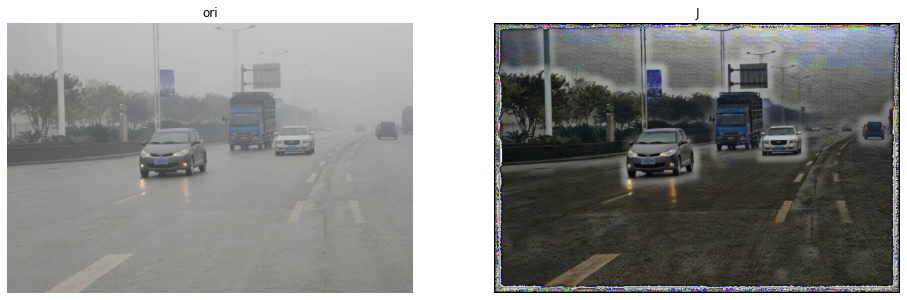

In [36]:
## Einsum test
# I = np.arange(9*3).reshape(9,3)
# p = np.arange(9).reshape(9,1)
# print('I=')
# print(I)
# print('p=')
# print(p)

# C = np.einsum('ij,ik->jk', I, p)
# print('C=')
# print(C)

# D0 = I[:,0]*p[:,0]
# D1 = I[:,1]*p[:,0]
# D2 = I[:,2]*p[:,0]
# print(D0.sum())
# print(D1.sum())
# print(D2.sum())

# print(img.shape)
# print(t.shape)

# I = np.arange(9*3).reshape(9,3)
# for i in I:
#     print(i)

dpi = plt.rcParams['figure.dpi']
plt.figure(figsize=(img.shape[1]*2//dpi, img.shape[0]*2//dpi))
t_clip_map = np.expand_dims(guide_t, 2).repeat(3, axis=2)
# J = ((imgs[fn].astype('int32')-As[fn].astype('int32')).astype('int32')/t_clip_map + As[fn].astype('float32'))
J = ((imgs[img_id].astype('float32')-As[img_id].astype('float32'))/t_clip_map + As[img_id].astype('float32'))

print(J.max())
print(J.min())
auto_show((1,2,1),imgs[img_id], 'ori')
auto_show((1,2,2),J.astype('uint8'), 'J')

In [9]:
!python try.py

origin image shape: (399, 600, 3)
(399, 600)
image has 239400 points
0.1% has 239 points
dark channel value >= 194 belong 0.1%
A at: [0, 380], value: [202 200 200]
^C
Traceback (most recent call last):
  File "try.py", line 126, in <module>
    k = cv2.waitKey(1)
KeyboardInterrupt


0it [00:00, ?it/s]

origin image shape: (399, 600, 3)
(399, 600)
image has 239400 points
0.1% has 239 points
dark channel value >= 194 belong 0.1%
A at: [0, 380], value: [200 200 202]


1it [00:01,  1.55s/it]

origin image shape: (400, 600, 3)
(400, 600)
image has 240000 points
0.1% has 240 points
dark channel value >= 210 belong 0.1%
A at: [0, 305], value: [235 242 249]


2it [00:03,  1.53s/it]

origin image shape: (388, 600, 3)
(388, 600)
image has 232800 points
0.1% has 232 points
dark channel value >= 217 belong 0.1%
A at: [0, 217], value: [232 229 222]


3it [00:04,  1.50s/it]

origin image shape: (398, 600, 3)
(398, 600)
image has 238800 points
0.1% has 238 points
dark channel value >= 179 belong 0.1%
A at: [164, 264], value: [182 198 214]


4it [00:06,  1.51s/it]

origin image shape: (480, 600, 3)
(480, 600)
image has 288000 points
0.1% has 288 points
dark channel value >= 204 belong 0.1%
A at: [0, 136], value: [207 217 209]


5it [00:07,  1.62s/it]

origin image shape: (399, 600, 3)
(399, 600)
image has 239400 points
0.1% has 239 points
dark channel value >= 255 belong 0.1%
A at: [0, 0], value: [40 43 44]


6it [00:09,  1.53s/it]


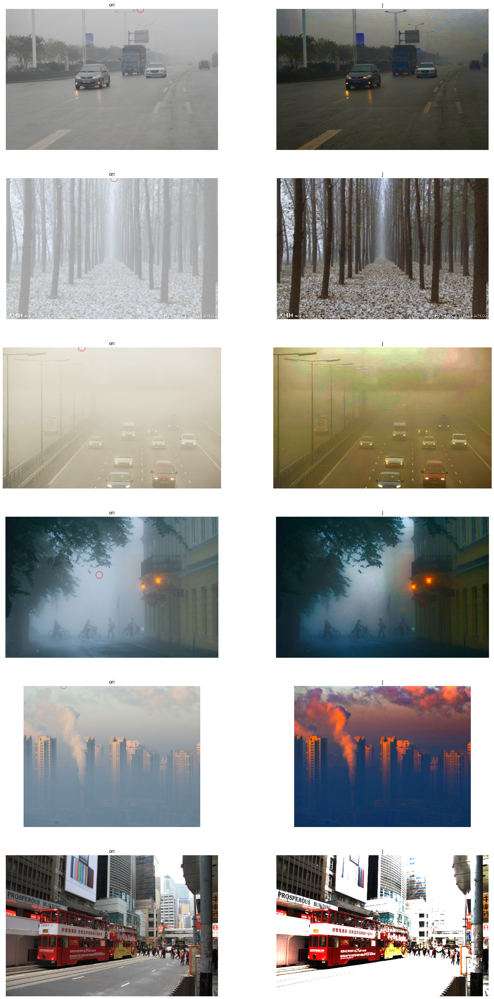

In [13]:
import cv2
import numpy as np
import sys
import copy


def estimating_atmospheric_light(image, dark_channel):
    i = dark_channel.shape
    num_sum = dark_channel.shape[0] * dark_channel.shape[1]
    print("image has " + str(num_sum) + " points")
    num = int(num_sum * 0.001)
    print("0.1% has " + str(num) + " points")

    pixels = []  # 储存全部的像素值
    for i in range(dark_channel.shape[0]):
        for j in range(dark_channel.shape[1]):
            pixels.append(dark_channel[i][j])

    pixels_sorted_id = sorted(range(len(pixels)), key=lambda k: pixels[k])  # 像素值排序，储存升序后的id
    # pixels_sorted = sorted(pixels)
    # print(pixels_sorted)

    value_threshold = pixels[pixels_sorted_id[len(pixels)-num]]
    print("dark channel value >= " + str(value_threshold) + " belong 0.1%")

    max_value = 0
    r = 0
    c = 0
    for i in range(dark_channel.shape[0]):
        for j in range(dark_channel.shape[1]):
            if dark_channel[i][j] > value_threshold:
                value = int(image[i][j][0]) + int(image[i][j][1]) + int(image[i][j][2])
                if value > max_value:
                    max_value = value
                    r = i
                    c = j

    return r, c


def dark_channel(img, size=15):
    r, g, b = cv2.split(img)
    min_img = cv2.min(r, cv2.min(g, b))
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (size, size))
    dc_img = cv2.erode(min_img, kernel)

    return dc_img


def guidedFilter(p, i, r, e):
    # 1
    mean_I = cv2.boxFilter(i, cv2.CV_64F, (r, r))
    mean_p = cv2.boxFilter(p, cv2.CV_64F, (r, r))
    corr_I = cv2.boxFilter(i * i, cv2.CV_64F, (r, r))
    corr_Ip = cv2.boxFilter(i * p, cv2.CV_64F, (r, r))
    # 2
    var_I = corr_I - mean_I * mean_I
    cov_Ip = corr_Ip - mean_I * mean_p
    # 3
    a = cov_Ip / (var_I + e)
    b = mean_p - a * mean_I
    # 4
    mean_a = cv2.boxFilter(a, cv2.CV_64F, (r, r))
    mean_b = cv2.boxFilter(b, cv2.CV_64F, (r, r))
    # 5
    q = mean_a * i + mean_b
    return q


def dehaze(image):
    dark_prior = dark_channel(image)

    print(dark_prior.shape)
    a_row, a_col = estimating_atmospheric_light(image, dark_prior)
    cv2.imshow("dark channel of origin", dark_prior)

    A = image[a_row][a_col]
    print("A at: [" + str(a_row) + ", " + str(a_col) + "], value: " + str(A))

    t = image / A
    t_min = dark_channel(t)

    img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY).astype('float64') / 255
    t_min = guidedFilter(t_min, img_gray, 225, 0.0001)
    cv2.imshow("transmission", t_min)

    t_x = [[0 for i in range(t_min.shape[1])] for i in range(t_min.shape[0])]
    for i in range(t_min.shape[0]):
        for j in range(t_min.shape[1]):
            t_x[i][j] = 1 - 0.95 * t_min[i][j]

    image_noHaze = copy.copy(image)
    for i in range(image_noHaze.shape[0]):
        for j in range(image_noHaze.shape[1]):
            # image_noHaze[i][j][0] = (image[i][j][0] - A[0]) / max(0.1, t_x[i][j]) + A[0]
            # image_noHaze[i][j][0] = max(min(image_noHaze[i][j][0], 255), 0)
            # image_noHaze[i][j][1] = (image[i][j][1] - A[1]) / max(0.1, t_x[i][j]) + A[1]
            # image_noHaze[i][j][1] = max(min(image_noHaze[i][j][1], 255), 0)
            # image_noHaze[i][j][2] = (image[i][j][2] - A[2]) / max(0.1, t_x[i][j]) + A[2]
            # image_noHaze[i][j][2] = max(min(image_noHaze[i][j][2], 255), 0)
            # if t_x[i][j] > 0.1:
            image_noHaze[i][j][0] = max(min((int(image[i][j][0]) - int(A[0])) / max(0.1, t_x[i][j]) + int(A[0]), 255), 0)
            image_noHaze[i][j][1] = max(min((int(image[i][j][1]) - int(A[1])) / max(0.1, t_x[i][j]) + int(A[1]), 255), 0)
            image_noHaze[i][j][2] = max(min((int(image[i][j][2]) - int(A[2])) / max(0.1, t_x[i][j]) + int(A[2]), 255), 0)

    image_noHaze = np.uint8(image_noHaze)

    return image_noHaze, a_row, a_col


if __name__ == '__main__':
    dpi = plt.rcParams['figure.dpi']
    plt.figure(figsize=(img.shape[1]*2//dpi, img.shape[0]*img_cnt//dpi))
    for i, fn in tqdm(enumerate(imgs)):
        image_origin = imgs[fn]
        # image_origin = cv2.resize(image_origin, (600, 600*image_origin.shape[0]//image_origin.shape[1]))[:,:,[2,1,0]]
        image_origin = cv2.resize(image_origin, (600, 600*image_origin.shape[0]//image_origin.shape[1]))
        print("origin image shape: " + str(image_origin.shape))
        result, row, col = dehaze(image_origin)

        u = col
        v = row
        cv2.circle(image_origin, (u, v), 10, (255, 0, 0), 1)
        auto_show((img_cnt,2,1+i*2),image_origin, 'ori')
        auto_show((img_cnt,2,2+i*2),result, 'J')

    plt.show()

    
#     cv2.imshow("origin", image_origin)
#     cv2.imshow("result", result)
#     cv2.imwrite('defog.jpg', result)

#     while True:
#         k = cv2.waitKey(1)
#         if k == 27:  # esc键
#             break
#     sys.exit(0)

    